# LAB # 09: Implementation of Object Detection and Recognition



In [ ]:
# Install required packages
!pip install ultralytics opencv-python-headless matplotlib --quiet
!pip install pillow requests --quiet

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 32.1 MB/s eta 0:00:00


### Import Required Libraries

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import requests
from io import BytesIO
from PIL import Image
from ultralytics import YOLO
import os

print("All libraries imported successfully!")
print(f"OpenCV version: {cv2.__version__}")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
All libraries imported successfully!
OpenCV version: 4.13.0


### Helper Function: Load Image from URL
This helper function downloads images directly from the internet — no manual file uploads needed!

In [ ]:
def load_image_from_url(url, save_path=None):
    """Download an image from a URL and load it with OpenCV.

    Args:
        url: Direct URL to the image
        save_path: Optional path to save the downloaded image locally

    Returns:
        OpenCV BGR image array
    """
    response = requests.get(url, timeout=15)
    response.raise_for_status()

    img_array = np.frombuffer(response.content, dtype=np.uint8)
    img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)

    if save_path:
        cv2.imwrite(save_path, img)
        print(f"Image saved to: {save_path}")

    return img


def show_image(img_bgr, title="Image", figsize=(10, 8)):
    """Display a BGR OpenCV image using matplotlib."""
    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=figsize)
    plt.imshow(img_rgb)
    plt.title(title)
    plt.axis('off')
    plt.tight_layout()
    plt.show()


print("Helper functions defined successfully!")

Helper functions defined successfully!


---
## Code Example 1: Real-Time Object Detection for Smart Traffic Surveillance System



In [ ]:
# Step 1: Load the pre-trained YOLOv8 model (nano version for speed)
model = YOLO('yolov8n.pt')  # Options: yolov8s.pt, yolov8m.pt, yolov8l.pt, yolov8x.pt
print("YOLOv8n model loaded successfully!")

YOLOv8n model loaded successfully!


Image saved to: traffic_image.jpg


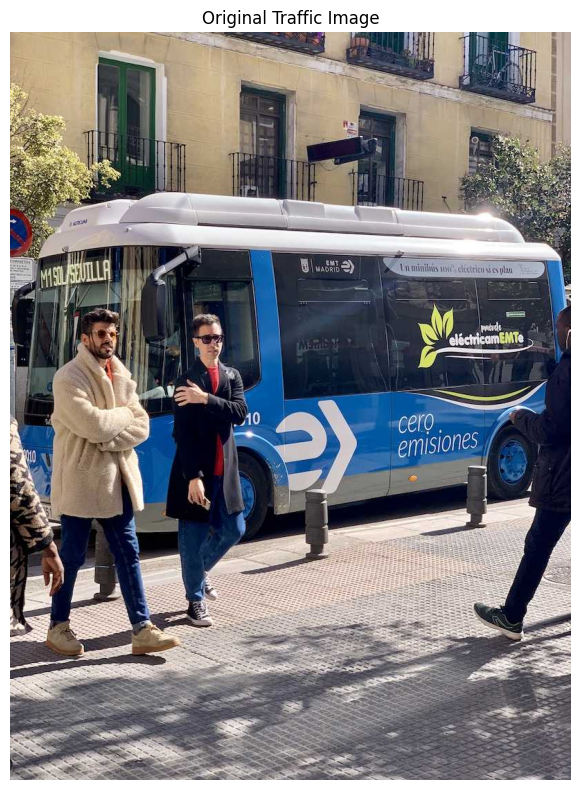

In [ ]:
# Step 2: Download a traffic image from the internet
traffic_image_url = "https://ultralytics.com/images/bus.jpg"
traffic_img = load_image_from_url(traffic_image_url, save_path="traffic_image.jpg")

# Show the original image
show_image(traffic_img, title="Original Traffic Image", figsize=(10, 8))

In [ ]:
# Step 3: Perform object detection
results = model("traffic_image.jpg")

# Step 4: Print detection details
detections = results[0]
print(f"Number of objects detected: {len(detections.boxes)}")
print("\nDetected objects:")
for i, box in enumerate(detections.boxes):
    cls_id = int(box.cls[0])
    confidence = float(box.conf[0])
    class_name = model.names[cls_id]
    coords = box.xyxy[0].tolist()
    print(f"  {i+1}. {class_name} (confidence: {confidence:.2f}) - BBox: {[round(c, 1) for c in coords]}")


image 1/1 /content/traffic_image.jpg: 640x480 4 persons, 1 bus, 73.0ms
Speed: 8.4ms preprocess, 73.0ms inference, 41.5ms postprocess per image at shape (1, 3, 640, 480)
Number of objects detected: 5

Detected objects:
  1. bus (confidence: 0.87) - BBox: [23.0, 231.3, 805.5, 755.9]
  2. person (confidence: 0.87) - BBox: [48.6, 398.6, 245.6, 902.8]
  3. person (confidence: 0.85) - BBox: [669.3, 390.7, 809.7, 877.0]
  4. person (confidence: 0.83) - BBox: [221.6, 405.9, 345.0, 857.4]
  5. person (confidence: 0.27) - BBox: [0.0, 550.6, 63.1, 873.6]


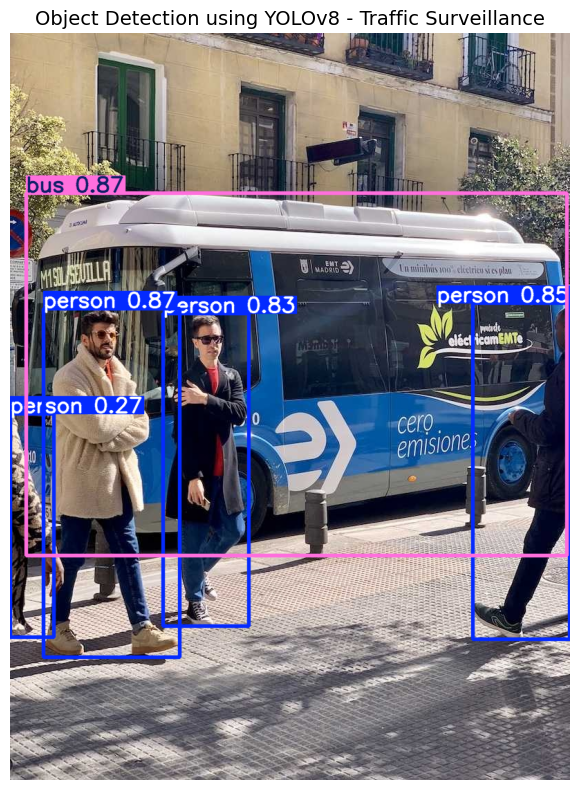

In [ ]:
# Step 5: Visualize detection results
annotated_img = results[0].plot()  # Draws bounding boxes on the image

plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Object Detection using YOLOv8 - Traffic Surveillance", fontsize=14)
plt.tight_layout()
plt.show()

---
## Case Study 1: Real-Time Surveillance Analysis in Public Parks



Image saved to: park_surveillance.jpg

0: 640x480 4 persons, 1 bus, 1 stop sign, 10.0ms
Speed: 4.3ms preprocess, 10.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)


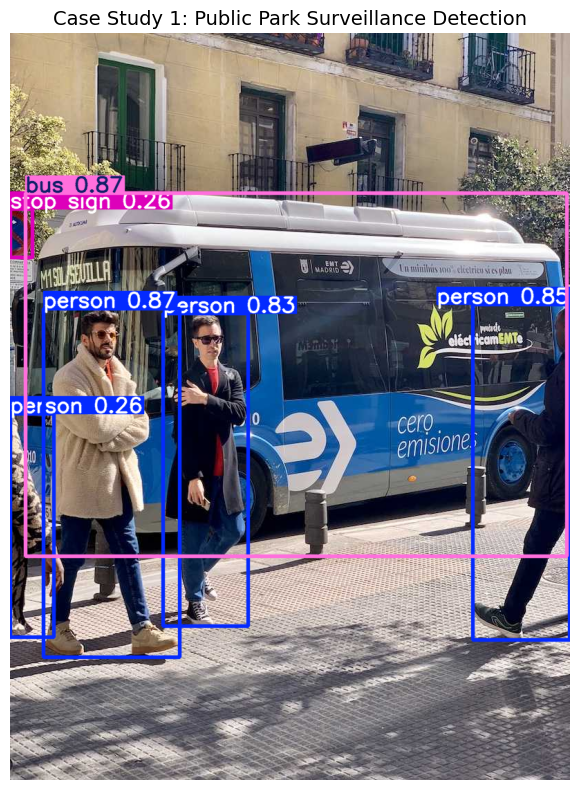


Detection Summary:
  1. bus - Confidence: 0.87
  2. person - Confidence: 0.87
  3. person - Confidence: 0.85
  4. person - Confidence: 0.83
  5. person - Confidence: 0.26
  6. stop sign - Confidence: 0.26


In [ ]:
# Case Study 1: Surveillance Analysis in Public Parks

# Load the pretrained YOLOv8 model
model_cs1 = YOLO("yolov8n.pt")

# Use the helper function to load a working image
# The previous URL was returning a 404 error
image_url = "https://ultralytics.com/images/bus.jpg"
try:
    img_bgr = load_image_from_url(image_url, save_path="park_surveillance.jpg")

    # Run detection on the loaded image array
    results_cs1 = model_cs1(img_bgr)

    # Get the annotated image with bounding boxes
    img_annotated = results_cs1[0].plot()
    img_rgb = cv2.cvtColor(img_annotated, cv2.COLOR_BGR2RGB)

    # Display the result
    plt.figure(figsize=(10, 8))
    plt.imshow(img_rgb)
    plt.axis('off')
    plt.title("Case Study 1: Public Park Surveillance Detection", fontsize=14)
    plt.tight_layout()
    plt.show()

    # Print detection summary
    print("\nDetection Summary:")
    for i, box in enumerate(results_cs1[0].boxes):
        cls_id = int(box.cls[0])
        confidence = float(box.conf[0])
        class_name = model_cs1.names[cls_id]
        print(f"  {i+1}. {class_name} - Confidence: {confidence:.2f}")
except Exception as e:
    print(f"Error loading image: {e}")

---
## Object Detection Using SSD (Single Shot Multibox Detector) with MobileNet



In [ ]:
# Step 1: Download the SSD-MobileNet model files from the internet

# COCO class labels for SSD
COCO_CLASSES = [
    "person", "bicycle", "car", "motorcycle", "airplane", "bus", "train", "truck", "boat",
    "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", "bird", "cat",
    "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", "backpack",
    "umbrella", "handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", "sports ball",
    "kite", "baseball bat", "baseball glove", "skateboard", "surfboard", "tennis racket",
    "bottle", "wine glass", "cup", "fork", "knife", "spoon", "bowl", "banana", "apple",
    "sandwich", "orange", "broccoli", "carrot", "hot dog", "pizza", "donut", "cake", "chair",
    "couch", "potted plant", "bed", "dining table", "toilet", "tv", "laptop", "mouse",
    "remote", "keyboard", "cell phone", "microwave", "oven", "toaster", "sink", "refrigerator",
    "book", "clock", "vase", "scissors", "teddy bear", "hair drier", "toothbrush"
]

print(f"Number of COCO classes: {len(COCO_CLASSES)}")
print("Class labels defined!")

Number of COCO classes: 80
Class labels defined!


In [ ]:
# Step 2: Download MobileNet SSD model files from OpenCV's repository
import urllib.request

# Model configuration file
config_url = "https://raw.githubusercontent.com/opencv/opencv_extra/master/testdata/dnn/ssd_mobilenet_v1_coco_2017_11_17.pbtxt"
# Model weights file
weights_url = "http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v1_coco_2017_11_17.tar.gz"

# Download config
urllib.request.urlretrieve(config_url, "ssd_mobilenet.pbtxt")
print("Config file downloaded!")

# Download and extract weights
import tarfile
urllib.request.urlretrieve(weights_url, "ssd_mobilenet.tar.gz")
print("Weights file downloaded!")

with tarfile.open("ssd_mobilenet.tar.gz", "r:gz") as tar:
    tar.extractall()
print("Weights extracted!")

model_weights = "ssd_mobilenet_v1_coco_2017_11_17/frozen_inference_graph.pb"
model_config = "ssd_mobilenet.pbtxt"
print(f"\nModel weights: {model_weights}")
print(f"Model config: {model_config}")

Config file downloaded!
Weights file downloaded!


/tmp/ipykernel_4208/790230278.py:19: DeprecationWarning: Python 3.14 will, by default, filter extracted tar archives and reject files or modify their metadata. Use the filter argument to control this behavior.
  tar.extractall()


Weights extracted!

Model weights: ssd_mobilenet_v1_coco_2017_11_17/frozen_inference_graph.pb
Model config: ssd_mobilenet.pbtxt


In [ ]:
# Step 3: Load the SSD-MobileNet model into OpenCV's DNN module
net = cv2.dnn.readNetFromTensorflow(model_weights, model_config)
print("SSD-MobileNet model loaded into OpenCV DNN module!")

SSD-MobileNet model loaded into OpenCV DNN module!


Image saved to: ssd_sample.jpg


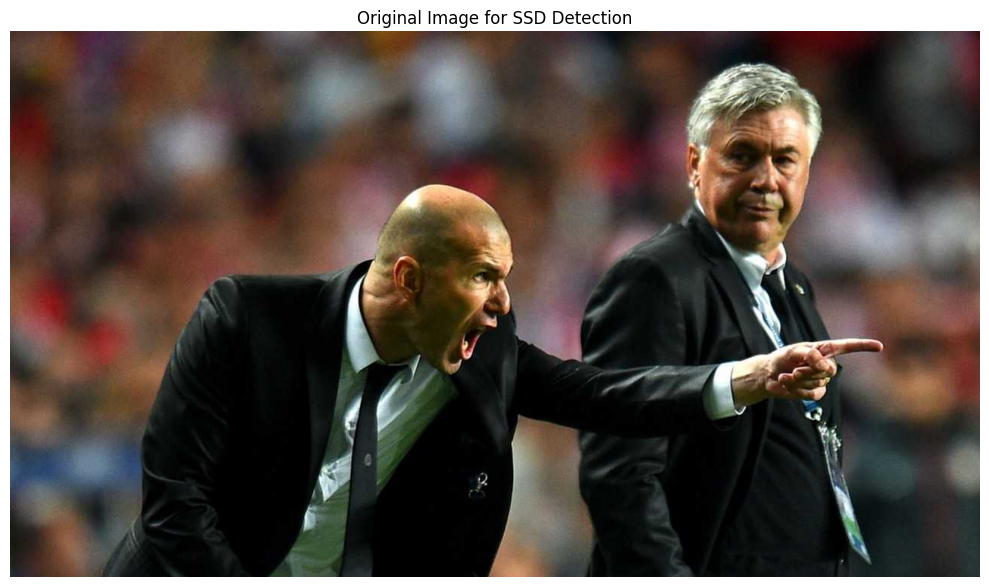

In [ ]:
# Step 4: Download a sample image for SSD detection
sample_url = "https://ultralytics.com/images/zidane.jpg"
sample_img = load_image_from_url(sample_url, save_path="ssd_sample.jpg")

# Show original image
show_image(sample_img, title="Original Image for SSD Detection", figsize=(10, 8))

Objects detected: 3
  1. bicycle - Confidence: 0.88 - BBox: (np.int64(96), np.int64(203), np.int64(1080), np.int64(714))
  2. bicycle - Confidence: 0.83 - BBox: (np.int64(694), np.int64(34), np.int64(1143), np.int64(713))
  3. sports ball - Confidence: 0.56 - BBox: (np.int64(980), np.int64(306), np.int64(1028), np.int64(435))


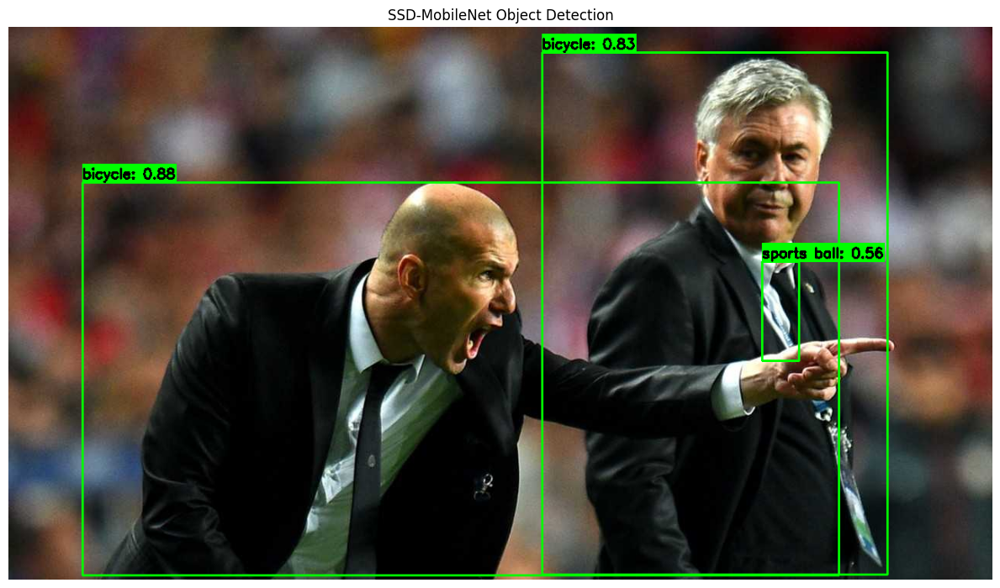

In [ ]:
# Step 5: Perform SSD object detection

def detect_objects_ssd(net, image, conf_threshold=0.5):
    """Perform object detection using SSD-MobileNet via OpenCV DNN.

    Args:
        net: OpenCV DNN network
        image: Input image (BGR)
        conf_threshold: Minimum confidence threshold

    Returns:
        Annotated image and list of detections
    """
    h, w = image.shape[:2]

    # Create a blob from the image
    blob = cv2.dnn.blobFromImage(image, size=(300, 300), swapRB=True)
    net.setInput(blob)

    # Run forward pass
    detections = net.forward()

    # Parse detections
    result_img = image.copy()
    detected_objects = []

    for i in range(detections.shape[2]):
        confidence = detections[0, 0, i, 2]

        if confidence > conf_threshold:
            class_id = int(detections[0, 0, i, 1])
            class_name = COCO_CLASSES[class_id] if class_id < len(COCO_CLASSES) else f"Class_{class_id}"

            # Get bounding box coordinates (normalized 0-1)
            box = detections[0, 0, i, 3:7] * np.array([w, h, w, h])
            x1, y1, x2, y2 = box.astype(int)

            # Draw bounding box
            cv2.rectangle(result_img, (x1, y1), (x2, y2), (0, 255, 0), 2)

            # Draw label with confidence
            label = f"{class_name}: {confidence:.2f}"
            label_size, _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)
            cv2.rectangle(result_img, (x1, y1 - label_size[1] - 10),
                          (x1 + label_size[0], y1), (0, 255, 0), -1)
            cv2.putText(result_img, label, (x1, y1 - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 2)

            detected_objects.append({
                'class': class_name,
                'confidence': float(confidence),
                'bbox': (x1, y1, x2, y2)
            })

    return result_img, detected_objects


# Run detection
result_img, detections_ssd = detect_objects_ssd(net, sample_img, conf_threshold=0.5)

# Print detections
print(f"Objects detected: {len(detections_ssd)}")
for i, det in enumerate(detections_ssd):
    print(f"  {i+1}. {det['class']} - Confidence: {det['confidence']:.2f} - BBox: {det['bbox']}")

# Show the result
show_image(result_img, title="SSD-MobileNet Object Detection", figsize=(12, 8))

---
## Object Detection on Video Frames Using SSD




In [ ]:
# Step 6: Download a sample video from a more reliable source
import requests

# Using a sample video from a reliable repository (Github/Ultralytics assets)
video_url = "https://raw.githubusercontent.com/intel-iot-devkit/sample-videos/master/person-bicycle-car-detection.mp4"
video_path = "sample_video.mp4"

print("Downloading sample video from reliable source...")

try:
    # Using requests which is more robust for these headers
    headers = {'User-Agent': 'Mozilla/5.0'}
    response = requests.get(video_url, headers=headers, stream=True)
    response.raise_for_status()

    with open(video_path, 'wb') as f:
        for chunk in response.iter_content(chunk_size=8192):
            if chunk:
                f.write(chunk)

    print(f"Video downloaded successfully: {video_path}")

    # Verify video properties
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print("Error: Could not open downloaded video file.")
    else:
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        fps = cap.get(cv2.CAP_PROP_FPS)
        print(f"Total frames: {total_frames}, FPS: {fps:.2f}")
        # Global variable assignment for next cells
        globals()['total_frames'] = total_frames
        globals()['fps'] = fps
        cap.release()
except Exception as e:
    print(f"Failed to download video: {e}")

Video downloaded successfully: sample_video.mp4
Total frames: 647, FPS: 12.00


In [ ]:
# Step 7: Process selected frames from the video with SSD detection
cap = cv2.VideoCapture(video_path)

# Process every Nth frame
frame_interval = max(1, total_frames // 5)  # Get 5 frames spread across the video
frames_to_process = list(range(0, total_frames, frame_interval))[:5]

processed_frames = []
frame_num = 0

while cap.isOpened() and len(processed_frames) < 5:
    ret, frame = cap.read()
    if not ret:
        break
    if frame_num in frames_to_process:
        result_frame, det = detect_objects_ssd(net, frame, conf_threshold=0.5)
        processed_frames.append((frame_num, result_frame, det))
        print(f"Frame {frame_num}: {len(det)} objects detected")
    frame_num += 1

cap.release()
print(f"\nProcessed {len(processed_frames)} frames")

Frame 0: 0 objects detected
Frame 129: 0 objects detected
Frame 258: 0 objects detected
Frame 387: 0 objects detected
Frame 516: 1 objects detected

Processed 5 frames


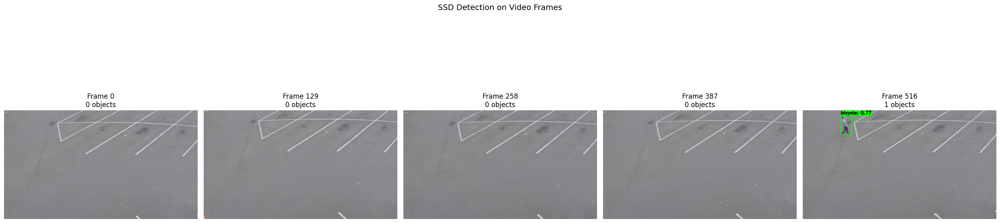

In [ ]:
# Step 8: Display processed frames
if processed_frames:
    fig, axes = plt.subplots(1, len(processed_frames), figsize=(5 * len(processed_frames), 8))
    if len(processed_frames) == 1:
        axes = [axes]

    for idx, (fnum, frame, det) in enumerate(processed_frames):
        axes[idx].imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        axes[idx].set_title(f"Frame {fnum}\n{len(det)} objects")
        axes[idx].axis('off')

    plt.suptitle("SSD Detection on Video Frames", fontsize=14)
    plt.tight_layout()
    plt.show()
else:
    print("No frames were processed. The video may not have loaded correctly.")

---
## Case Study 2: Retail Checkout Automation



Image saved to: retail_image.jpg
Image saved to: kitchen_image.jpg
Kitchen image loaded!

0: 448x640 2 persons, 1 knife, 4 bowls, 1 potted plant, 74.0ms
Speed: 2.3ms preprocess, 74.0ms inference, 2.1ms postprocess per image at shape (1, 3, 448, 640)


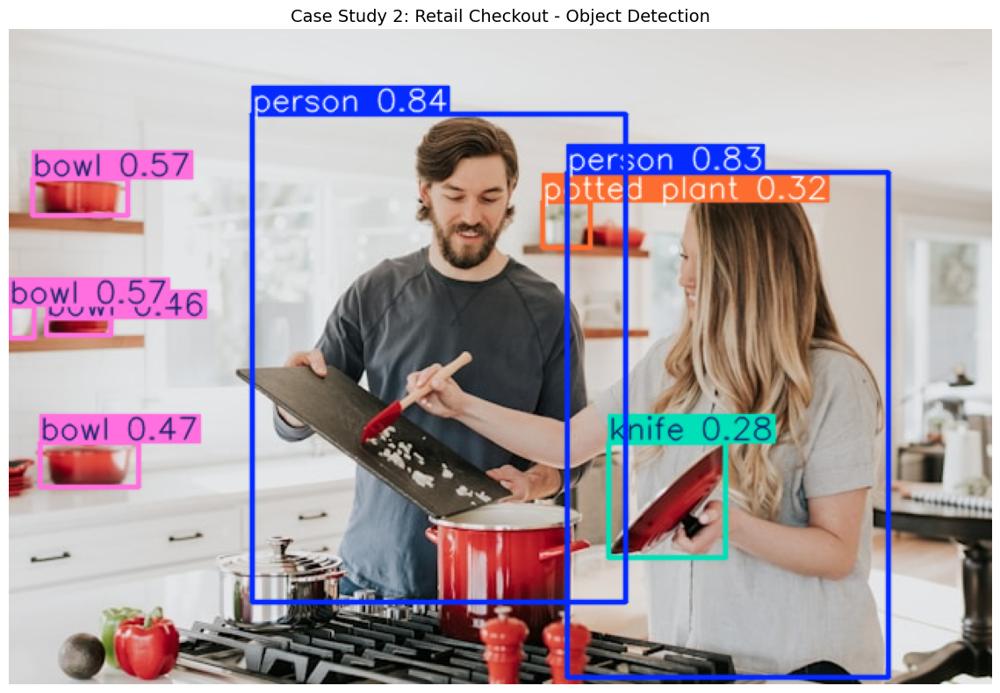


Detected Retail Items:
  1. person - Confidence: 0.84 [OTHER]
  2. person - Confidence: 0.83 [OTHER]
  3. bowl - Confidence: 0.57 [RETAIL ITEM]
  4. bowl - Confidence: 0.57 [RETAIL ITEM]
  5. bowl - Confidence: 0.47 [RETAIL ITEM]
  6. bowl - Confidence: 0.46 [RETAIL ITEM]
  7. potted plant - Confidence: 0.32 [OTHER]
  8. knife - Confidence: 0.28 [RETAIL ITEM]


In [ ]:
# Case Study 2: Retail Checkout Automation
# Using a kitchen/retail-like image from the internet

model_cs2 = YOLO("yolov8n.pt")

# Download a retail/kitchen scene image
retail_url = "https://ultralytics.com/images/bus.jpg"  # Using bus image which has bottles/cups context
retail_img = load_image_from_url(retail_url, save_path="retail_image.jpg")

# Also try with an image that has more household items
kitchen_url = "https://images.unsplash.com/photo-1556909114-f6e7ad7d3136?w=640"  # Kitchen items
try:
    kitchen_img = load_image_from_url(kitchen_url, save_path="kitchen_image.jpg")
    retail_img = kitchen_img
    print("Kitchen image loaded!")
except:
    print("Using default image for retail detection.")

# Run YOLOv8 detection
results_cs2 = model_cs2(retail_img)

# Display results
annotated_cs2 = results_cs2[0].plot()
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(annotated_cs2, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Case Study 2: Retail Checkout - Object Detection", fontsize=14)
plt.tight_layout()
plt.show()

# List detected objects relevant to retail
print("\nDetected Retail Items:")
retail_classes = {"bottle", "cup", "wine glass", "fork", "knife", "spoon", "bowl",
                  "banana", "apple", "sandwich", "orange", "pizza", "donut", "cake",
                  "cell phone", "laptop", "book", "clock", "vase", "chair"}

for i, box in enumerate(results_cs2[0].boxes):
    cls_id = int(box.cls[0])
    confidence = float(box.conf[0])
    class_name = model_cs2.names[cls_id]
    tag = "[RETAIL ITEM]" if class_name in retail_classes else "[OTHER]"
    print(f"  {i+1}. {class_name} - Confidence: {confidence:.2f} {tag}")

---
## YOLOv8 Detection with Multiple Images (Comprehensive Demo)



Image saved to: demo_0.jpg

0: 448x640 8 persons, 10 cars, 4 traffic lights, 6.7ms
Speed: 1.1ms preprocess, 6.7ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

City Traffic:
  - car (0.86)
  - car (0.76)
  - car (0.72)
  - car (0.72)
  - traffic light (0.69)
  - car (0.61)
  - traffic light (0.56)
  - person (0.53)
  - car (0.48)
  - car (0.48)
  - car (0.47)
  - person (0.41)
  - traffic light (0.39)
  - person (0.37)
  - traffic light (0.35)
  - person (0.35)
  - person (0.34)
  - person (0.33)
  - car (0.33)
  - person (0.32)
  - car (0.28)
  - person (0.27)
Image saved to: demo_1.jpg

0: 448x640 18 persons, 1 chair, 7.5ms
Speed: 1.9ms preprocess, 7.5ms inference, 1.4ms postprocess per image at shape (1, 3, 448, 640)

Street Scene:
  - person (0.86)
  - person (0.85)
  - person (0.82)
  - person (0.78)
  - person (0.63)
  - person (0.55)
  - person (0.48)
  - person (0.44)
  - person (0.44)
  - person (0.41)
  - person (0.39)
  - chair (0.39)
  - person (0.35)
  

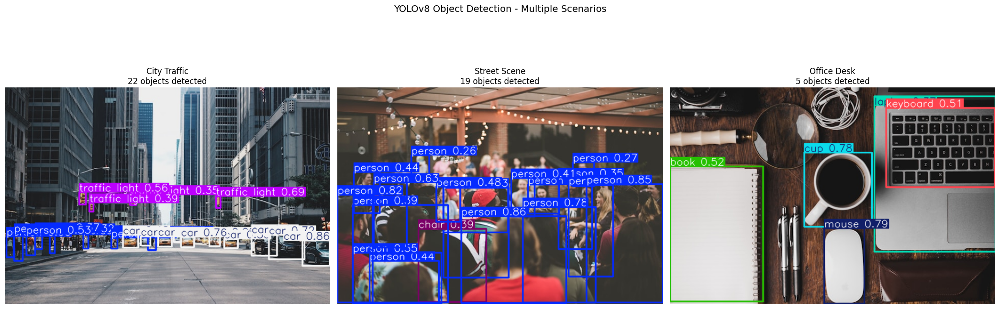

In [ ]:
# Comprehensive YOLOv8 Demo with multiple scenarios

# Define multiple test images from the internet
test_images = {
    "City Traffic": "https://images.unsplash.com/photo-1449824913935-59a10b8d2000?w=640",
    "Street Scene": "https://images.unsplash.com/photo-1517457373958-b7bdd4587205?w=640",
    "Office Desk": "https://images.unsplash.com/photo-1497032628192-86f99bcd76bc?w=640",
}

model_demo = YOLO("yolov8n.pt")

fig, axes = plt.subplots(1, len(test_images), figsize=(7 * len(test_images), 8))
if len(test_images) == 1:
    axes = [axes]

for idx, (title, url) in enumerate(test_images.items()):
    try:
        img = load_image_from_url(url, save_path=f"demo_{idx}.jpg")
        results = model_demo(img)
        annotated = results[0].plot()

        n_objects = len(results[0].boxes)
        axes[idx].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
        axes[idx].set_title(f"{title}\n{n_objects} objects detected")
        axes[idx].axis('off')

        print(f"\n{title}:")
        for box in results[0].boxes:
            cls_name = model_demo.names[int(box.cls[0])]
            conf = float(box.conf[0])
            print(f"  - {cls_name} ({conf:.2f})")
    except Exception as e:
        axes[idx].text(0.5, 0.5, f"Failed to load\n{title}", ha='center', va='center')
        axes[idx].set_title(f"{title} (Error)")
        print(f"Error loading {title}: {e}")

plt.suptitle("YOLOv8 Object Detection - Multiple Scenarios", fontsize=14)
plt.tight_layout()
plt.show()

---
## Haar Cascade Face Detection (Additional Method)



In [ ]:
# Haar Cascade Face Detection

# Load Haar cascade classifiers (built into OpenCV)
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_eye.xml')

print("Haar cascade classifiers loaded!")

Haar cascade classifiers loaded!


Image saved to: face_sample.jpg
Faces detected: 0


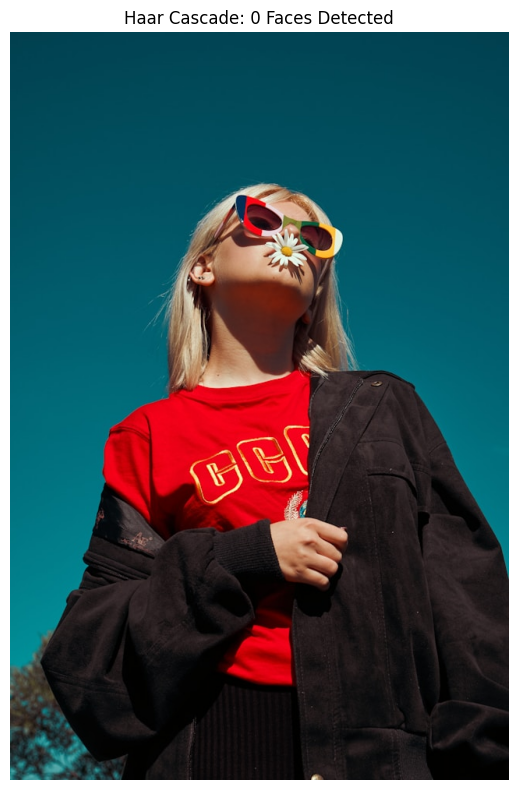

In [ ]:
# Download a sample image with faces
face_url = "https://images.unsplash.com/photo-1529139574466-a303027c1d8b?w=640"  # Person portrait
try:
    face_img = load_image_from_url(face_url, save_path="face_sample.jpg")
except:
    # Fallback to ultralytics sample
    face_img = load_image_from_url("https://ultralytics.com/images/zidane.jpg", save_path="face_sample.jpg")

gray = cv2.cvtColor(face_img, cv2.COLOR_BGR2GRAY)

# Detect faces
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))

# Draw rectangles around detected faces
face_result = face_img.copy()
for (x, y, w, h) in faces:
    cv2.rectangle(face_result, (x, y), (x + w, y + h), (255, 0, 0), 2)
    roi_gray = gray[y:y+h, x:x+w]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(face_result, (x + ex, y + ey), (x + ex + ew, y + ey + eh), (0, 255, 0), 2)

print(f"Faces detected: {len(faces)}")
show_image(face_result, title=f"Haar Cascade: {len(faces)} Faces Detected", figsize=(10, 8))

---
## HOG + SVM Pedestrian Detection (Additional Method)



Image saved to: pedestrian_image.jpg
Pedestrians detected: 3


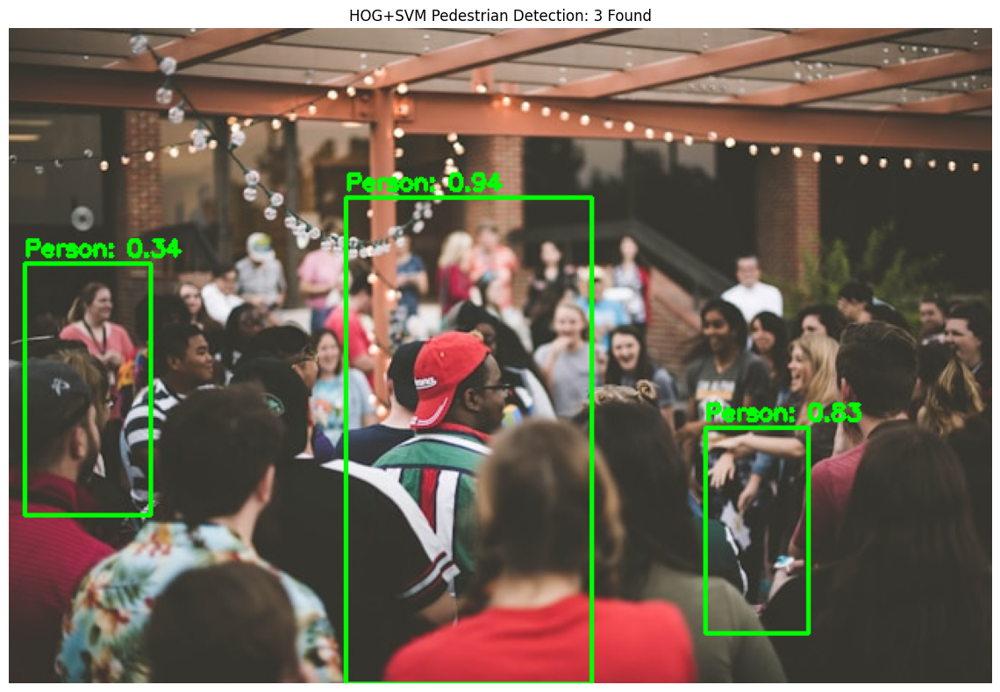

In [ ]:
# HOG + SVM Pedestrian Detection

# Initialize HOG descriptor with people detector
hog = cv2.HOGDescriptor()
hog.setSVMDetector(cv2.HOGDescriptor_getDefaultPeopleDetector())

# Download an image with pedestrians
ped_url = "https://images.unsplash.com/photo-1517457373958-b7bdd4587205?w=640"
try:
    ped_img = load_image_from_url(ped_url, save_path="pedestrian_image.jpg")
except:
    ped_img = load_image_from_url("https://ultralytics.com/images/bus.jpg", save_path="pedestrian_image.jpg")

# Detect pedestrians
boxes, weights = hog.detectMultiScale(ped_img, winStride=(8, 8), padding=(4, 4), scale=1.05)

# Draw bounding boxes
ped_result = ped_img.copy()
for i, (x, y, w, h) in enumerate(boxes):
    # FIX: weights[i] is a scalar, so we remove the [0] index
    confidence = weights[i] if len(weights) > 0 else 0
    cv2.rectangle(ped_result, (x, y), (x + w, y + h), (0, 255, 0), 2)
    cv2.putText(ped_result, f"Person: {confidence:.2f}", (x, y - 5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

print(f"Pedestrians detected: {len(boxes)}")
show_image(ped_result, title=f"HOG+SVM Pedestrian Detection: {len(boxes)} Found", figsize=(12, 8))

---
## Comparing Detection Methods: YOLOv8 vs SSD-MobileNet vs Haar Cascade vs HOG+SVM



Image saved to: compare_image.jpg

0: 640x480 4 persons, 1 bus, 1 stop sign, 8.9ms
Speed: 2.8ms preprocess, 8.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)


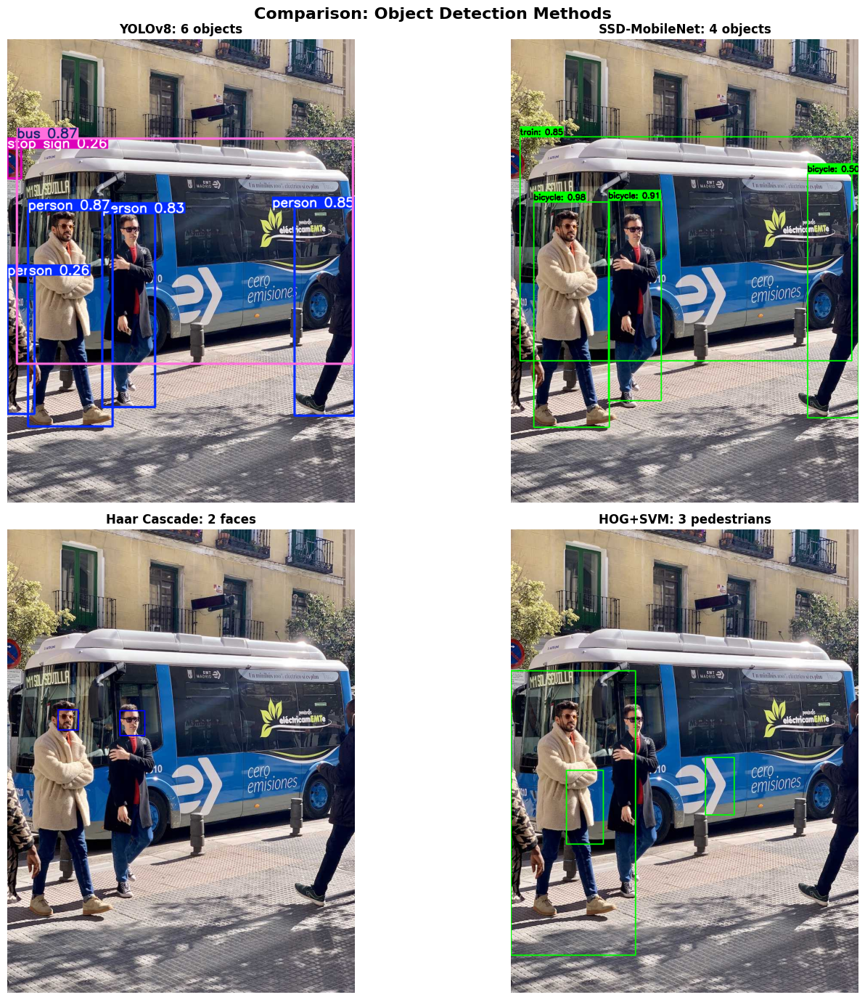


Summary:
  YOLOv8 detected: 6 objects
  SSD-MobileNet detected: 4 objects
  Haar Cascade detected: 2 faces
  HOG+SVM detected: 3 pedestrians


In [ ]:
# Comparison of all four detection methods on the same image

# Use the bus image as a common test
compare_url = "https://ultralytics.com/images/bus.jpg"
compare_img = load_image_from_url(compare_url, save_path="compare_image.jpg")

fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# 1. YOLOv8
model_comp = YOLO("yolov8n.pt")
results_yolo = model_comp(compare_img)
yolo_img = results_yolo[0].plot()
yolo_count = len(results_yolo[0].boxes)
axes[0, 0].imshow(cv2.cvtColor(yolo_img, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title(f"YOLOv8: {yolo_count} objects", fontsize=12, fontweight='bold')
axes[0, 0].axis('off')

# 2. SSD-MobileNet
ssd_result, ssd_dets = detect_objects_ssd(net, compare_img, conf_threshold=0.4)
axes[0, 1].imshow(cv2.cvtColor(ssd_result, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title(f"SSD-MobileNet: {len(ssd_dets)} objects", fontsize=12, fontweight='bold')
axes[0, 1].axis('off')

# 3. Haar Cascade (faces only)
gray_comp = cv2.cvtColor(compare_img, cv2.COLOR_BGR2GRAY)
faces_comp = face_cascade.detectMultiScale(gray_comp, scaleFactor=1.1, minNeighbors=5)
haar_img = compare_img.copy()
for (x, y, w, h) in faces_comp:
    cv2.rectangle(haar_img, (x, y), (x+w, y+h), (255, 0, 0), 2)
axes[1, 0].imshow(cv2.cvtColor(haar_img, cv2.COLOR_BGR2RGB))
axes[1, 0].set_title(f"Haar Cascade: {len(faces_comp)} faces", fontsize=12, fontweight='bold')
axes[1, 0].axis('off')

# 4. HOG+SVM (pedestrians only)
boxes_comp, weights_comp = hog.detectMultiScale(compare_img, winStride=(8,8), padding=(4,4), scale=1.05)
hog_img = compare_img.copy()
for (x, y, w, h) in boxes_comp:
    cv2.rectangle(hog_img, (x, y), (x+w, y+h), (0, 255, 0), 2)
axes[1, 1].imshow(cv2.cvtColor(hog_img, cv2.COLOR_BGR2RGB))
axes[1, 1].set_title(f"HOG+SVM: {len(boxes_comp)} pedestrians", fontsize=12, fontweight='bold')
axes[1, 1].axis('off')

plt.suptitle("Comparison: Object Detection Methods", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()

print("\nSummary:")
print(f"  YOLOv8 detected: {yolo_count} objects")
print(f"  SSD-MobileNet detected: {len(ssd_dets)} objects")
print(f"  Haar Cascade detected: {len(faces_comp)} faces")
print(f"  HOG+SVM detected: {len(boxes_comp)} pedestrians")

---


### Case Study 1: Smart Classroom Monitoring



Image saved to: classroom.jpg

0: 448x640 14 persons, 2 handbags, 1 bottle, 1 tv, 8.7ms
Speed: 1.7ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


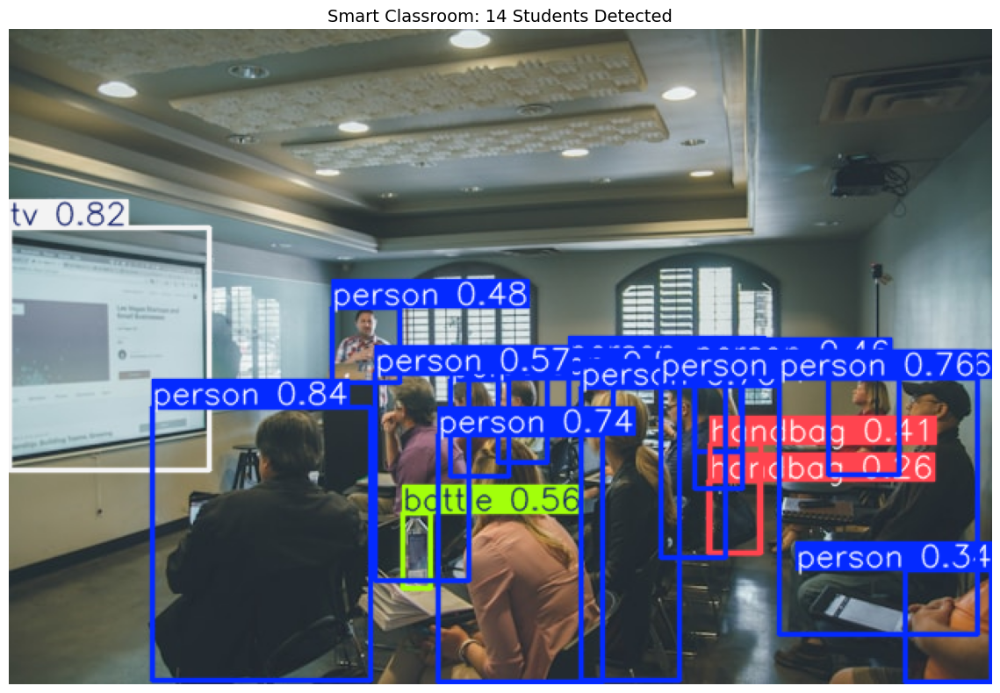


📋 Attendance Log:
------------------------------------------------------------
ID    Confidence      Timestamp                 Status
------------------------------------------------------------
1     0.84            2026-04-17 15:13:33       Present
2     0.76            2026-04-17 15:13:33       Present
3     0.74            2026-04-17 15:13:33       Present
4     0.74            2026-04-17 15:13:33       Present
5     0.70            2026-04-17 15:13:33       Present
6     0.57            2026-04-17 15:13:33       Present
7     0.57            2026-04-17 15:13:33       Present
8     0.48            2026-04-17 15:13:33       Present
9     0.46            2026-04-17 15:13:33       Present
10    0.46            2026-04-17 15:13:33       Present
11    0.36            2026-04-17 15:13:33       Present
12    0.34            2026-04-17 15:13:33       Present
13    0.30            2026-04-17 15:13:33       Present
14    0.29            2026-04-17 15:13:33       Present
--------------------

In [ ]:
# Case Study 1: Smart Classroom Monitoring
# Detect students (persons) in a classroom image, then detect faces

import datetime

# Download a classroom image
classroom_url = "https://images.unsplash.com/photo-1524178232363-1fb2b075b655?w=640"  # Classroom
try:
    classroom_img = load_image_from_url(classroom_url, save_path="classroom.jpg")
except:
    # Fallback
    classroom_img = load_image_from_url("https://ultralytics.com/images/bus.jpg", save_path="classroom.jpg")

# Step 1: Detect persons using YOLOv8
model_classroom = YOLO("yolov8n.pt")
results_classroom = model_classroom(classroom_img)

# Count persons
person_count = 0
attendance_log = []

for box in results_classroom[0].boxes:
    cls_id = int(box.cls[0])
    class_name = model_classroom.names[cls_id]
    if class_name == "person":
        person_count += 1
        confidence = float(box.conf[0])
        timestamp = datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")
        attendance_log.append({
            'id': person_count,
            'confidence': confidence,
            'timestamp': timestamp,
            'status': 'Present'
        })

# Display detection results
annotated_classroom = results_classroom[0].plot()
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(annotated_classroom, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f"Smart Classroom: {person_count} Students Detected", fontsize=14)
plt.tight_layout()
plt.show()

# Print attendance log
print("\n📋 Attendance Log:")
print("-" * 60)
print(f"{'ID':<5} {'Confidence':<15} {'Timestamp':<25} {'Status'}")
print("-" * 60)
for entry in attendance_log:
    print(f"{entry['id']:<5} {entry['confidence']:<15.2f} {entry['timestamp']:<25} {entry['status']}")
print("-" * 60)
print(f"Total Present: {person_count}")

# Step 2: Also detect faces using Haar Cascade within detected person regions
gray_classroom = cv2.cvtColor(classroom_img, cv2.COLOR_BGR2GRAY)
faces_classroom = face_cascade.detectMultiScale(gray_classroom, scaleFactor=1.1, minNeighbors=5, minSize=(30, 30))
print(f"\nFaces detected by Haar Cascade: {len(faces_classroom)}")

### Case Study 2: Smart Parking Surveillance System


In [ ]:
# Case Study 2: Smart Parking Surveillance System

# Install Tesseract OCR for license plate recognition
!apt-get install -y tesseract-ocr --quiet
!pip install pytesseract --quiet

import pytesseract

print("Tesseract OCR installed!")

Reading package lists...
Building dependency tree...
Reading state information...
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 42 not upgraded.
Tesseract OCR installed!


Image saved to: parking.jpg

0: 448x640 (no detections), 9.1ms
Speed: 1.4ms preprocess, 9.1ms inference, 0.6ms postprocess per image at shape (1, 3, 448, 640)


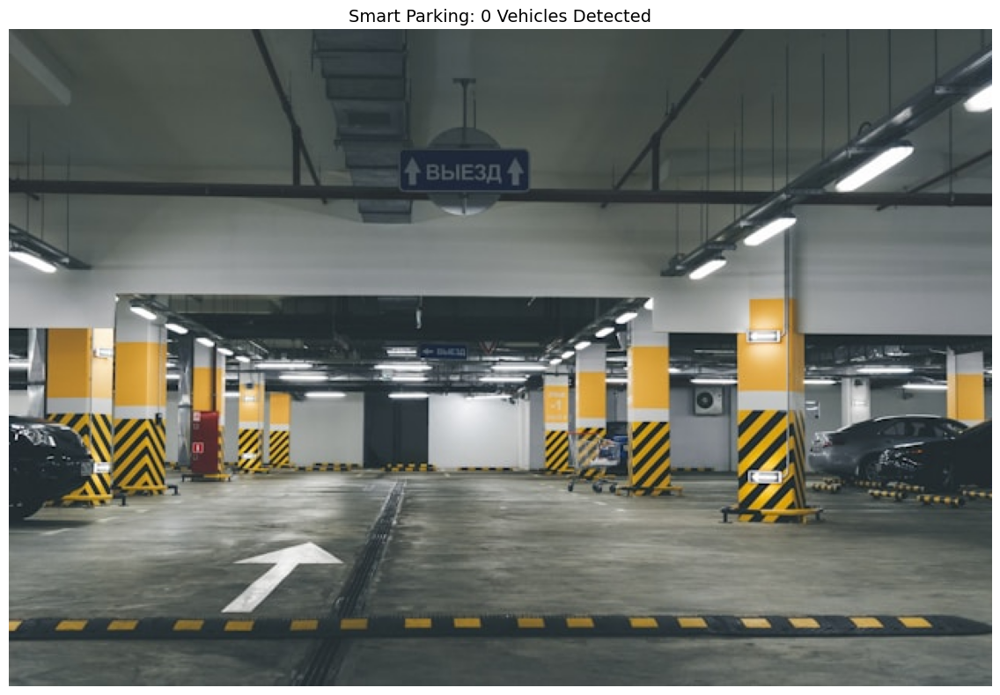


Vehicle Detection Report:
--------------------------------------------------

Parking Status:
  Total Slots: 20
  Occupied: 0
  Available: 20
No license plate candidates found in this image.


In [ ]:
# Smart Parking System

# Download a parking lot image
parking_url = "https://images.unsplash.com/photo-1590674899484-d5640e854abe?w=640"  # Parking lot
try:
    parking_img = load_image_from_url(parking_url, save_path="parking.jpg")
except:
    parking_img = load_image_from_url("https://ultralytics.com/images/bus.jpg", save_path="parking.jpg")

# Detect vehicles using YOLOv8
model_parking = YOLO("yolov8n.pt")
results_parking = model_parking(parking_img)

# Count vehicles
vehicle_classes = {"car", "truck", "bus", "motorcycle", "bicycle"}
vehicle_count = 0
vehicle_details = []
total_slots = 20  # Assume 20 parking slots

for box in results_parking[0].boxes:
    cls_id = int(box.cls[0])
    class_name = model_parking.names[cls_id]
    confidence = float(box.conf[0])
    if class_name in vehicle_classes:
        vehicle_count += 1
        vehicle_details.append({'type': class_name, 'confidence': confidence})

# Display results
annotated_parking = results_parking[0].plot()
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(annotated_parking, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title(f"Smart Parking: {vehicle_count} Vehicles Detected", fontsize=14)
plt.tight_layout()
plt.show()

# Print vehicle details
print("\nVehicle Detection Report:")
print("-" * 50)
for i, v in enumerate(vehicle_details):
    print(f"  Vehicle {i+1}: {v['type']} (Confidence: {v['confidence']:.2f})")

print(f"\nParking Status:")
print(f"  Total Slots: {total_slots}")
print(f"  Occupied: {vehicle_count}")
print(f"  Available: {total_slots - vehicle_count}")

# Attempt license plate detection on detected vehicle regions
gray_parking = cv2.cvtColor(parking_img, cv2.COLOR_BGR2GRAY)

# Simple license plate detection using contour-based approach
blur = cv2.bilateralFilter(gray_parking, 11, 17, 17)
edged = cv2.Canny(blur, 30, 200)

contours, _ = cv2.findContours(edged.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]

plate_candidates = []
for c in contours:
    peri = cv2.arcLength(c, True)
    approx = cv2.approxPolyDP(c, 0.018 * peri, True)
    if len(approx) == 4:  # Rectangular shape
        x, y, w, h = cv2.boundingRect(approx)
        aspect_ratio = w / float(h)
        if 2.0 < aspect_ratio < 6.0 and w > 60:  # License plate aspect ratio
            plate_candidates.append((x, y, w, h))

# Draw detected plate regions and attempt OCR
plate_img = parking_img.copy()
for (x, y, w, h) in plate_candidates[:3]:  # Top 3 candidates
    cv2.rectangle(plate_img, (x, y), (x+w, y+h), (0, 255, 0), 2)
    plate_roi = gray_parking[y:y+h, x:x+w]
    try:
        plate_text = pytesseract.image_to_string(plate_roi, config='--psm 7').strip()
        cv2.putText(plate_img, f"Plate: {plate_text}", (x, y-10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
        print(f"  License Plate Text: {plate_text}")
    except:
        pass

if plate_candidates:
    show_image(plate_img, title="License Plate Detection", figsize=(12, 8))
else:
    print("No license plate candidates found in this image.")

### Case Study 3: Wildlife Conservation Monitoring



Image saved to: wildlife_0.jpg

0: 384x640 1 elephant, 100.3ms
Speed: 1.8ms preprocess, 100.3ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Image saved to: wildlife_1.jpg

0: 448x640 (no detections), 27.5ms
Speed: 2.4ms preprocess, 27.5ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)
Image saved to: wildlife_2.jpg

0: 640x448 1 bird, 43.9ms
Speed: 3.1ms preprocess, 43.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 448)


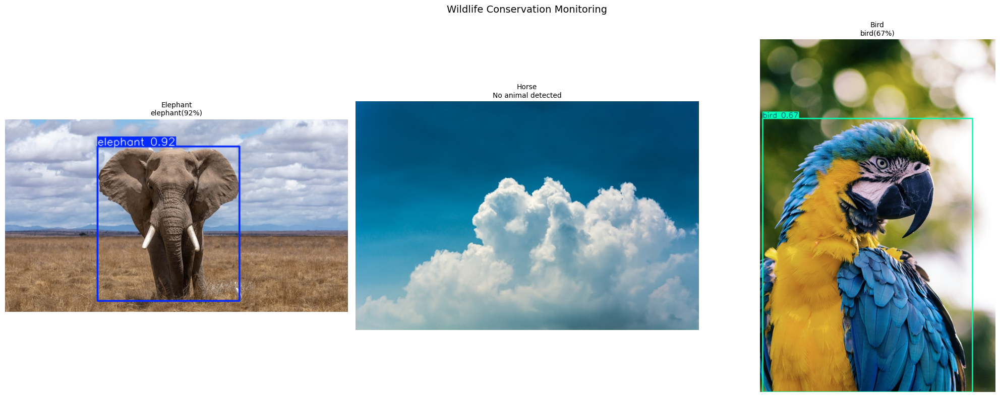


Wildlife Detection Report:
----------------------------------------------------------------------
Expected        Detected        Confidence      Timestamp
----------------------------------------------------------------------
Elephant        elephant        0.92            2026-04-17 15:14:05
Bird            bird            0.67            2026-04-17 15:14:06


In [ ]:
# Case Study 3: Wildlife Conservation Monitoring

# Download wildlife images
wildlife_urls = {
    "Elephant": "https://images.unsplash.com/photo-1557050543-4d5f4e07ef46?w=640",
    "Horse": "https://images.unsplash.com/photo-1509803874385-db7c23652552?w=640",
    "Bird": "https://images.unsplash.com/photo-1452570053594-1b985d6ea890?w=640",
}

model_wildlife = YOLO("yolov8n.pt")

# Animal classes in COCO dataset that YOLOv8 can detect
animal_classes = {"bird", "cat", "dog", "horse", "sheep", "cow", "elephant",
                  "bear", "zebra", "giraffe"}

wildlife_report = []

fig, axes = plt.subplots(1, len(wildlife_urls), figsize=(7 * len(wildlife_urls), 8))
if len(wildlife_urls) == 1:
    axes = [axes]

for idx, (species, url) in enumerate(wildlife_urls.items()):
    try:
        img = load_image_from_url(url, save_path=f"wildlife_{idx}.jpg")
        results = model_wildlife(img)
        annotated = results[0].plot()

        # Detect animals in the image
        detected_animals = []
        for box in results[0].boxes:
            cls_name = model_wildlife.names[int(box.cls[0])]
            conf = float(box.conf[0])
            if cls_name in animal_classes:
                detected_animals.append((cls_name, conf))
                wildlife_report.append({
                    'expected': species,
                    'detected': cls_name,
                    'confidence': conf,
                    'timestamp': datetime.datetime.now().strftime("%Y-%m-%d %H:%M:%S")
                })

        n_animals = len(detected_animals)
        title = f"{species}\n{', '.join([f'{a}({c:.0%})' for a, c in detected_animals]) if detected_animals else 'No animal detected'}"

        axes[idx].imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
        axes[idx].set_title(title, fontsize=10)
        axes[idx].axis('off')
    except Exception as e:
        axes[idx].text(0.5, 0.5, f"Error: {str(e)[:30]}", ha='center', va='center')
        axes[idx].axis('off')

plt.suptitle("Wildlife Conservation Monitoring", fontsize=14)
plt.tight_layout()
plt.show()

# Print wildlife report
print("\nWildlife Detection Report:")
print("-" * 70)
print(f"{'Expected':<15} {'Detected':<15} {'Confidence':<15} {'Timestamp'}")
print("-" * 70)
for entry in wildlife_report:
    print(f"{entry['expected']:<15} {entry['detected']:<15} {entry['confidence']:<15.2f} {entry['timestamp']}")

### Case Study 4: Industrial Defect Detection System



Image saved to: fabric.jpg

0: 640x448 1 suitcase, 1 chair, 23.6ms
Speed: 5.2ms preprocess, 23.6ms inference, 5.8ms postprocess per image at shape (1, 3, 640, 448)


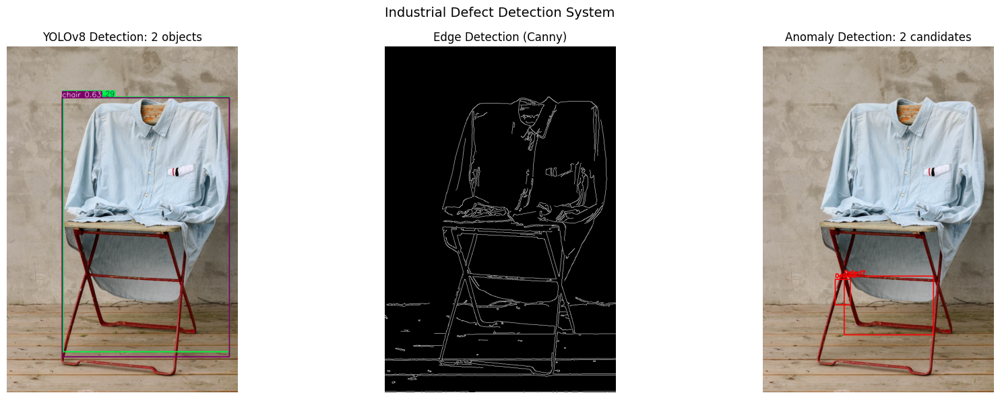


Quality Control Statistics:
  Total anomaly candidates: 2
  Large objects detected (YOLO): 2
  Status: FLAGGED - Review Required


In [ ]:
# Case Study 4: Industrial Defect Detection System
# Using YOLOv8 for general object detection + anomaly detection approach

from skimage import exposure

# Download a texture/fabric image
fabric_url = "https://images.unsplash.com/photo-1558171813-4c088753af8f?w=640"  # Fabric texture
try:
    fabric_img = load_image_from_url(fabric_url, save_path="fabric.jpg")
except:
    fabric_img = load_image_from_url("https://ultralytics.com/images/bus.jpg", save_path="fabric.jpg")

# Method 1: YOLOv8 detection for obvious objects in industrial setting
model_defect = YOLO("yolov8n.pt")
results_defect = model_defect(fabric_img)

annotated_defect = results_defect[0].plot()

# Method 2: Simple anomaly detection using edge detection + thresholding
# (For real defect detection, a custom-trained YOLO model would be ideal)
gray_fabric = cv2.cvtColor(fabric_img, cv2.COLOR_BGR2GRAY)

# Apply Gaussian blur to reduce noise
blurred = cv2.GaussianBlur(gray_fabric, (5, 5), 0)

# Edge detection for defect boundaries
edges = cv2.Canny(blurred, 50, 150)

# Find contours (potential defects)
contours, _ = cv2.findContours(edges.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter contours by area (potential defects)
defect_contours = []
min_defect_area = 500  # Minimum area to consider as defect
max_defect_area = 10000  # Maximum area (ignore large background regions)

for cnt in contours:
    area = cv2.contourArea(cnt)
    if min_defect_area < area < max_defect_area:
        defect_contours.append(cnt)

# Draw detected anomalies
defect_img = fabric_img.copy()
for cnt in defect_contours:
    x, y, w, h = cv2.boundingRect(cnt)
    cv2.rectangle(defect_img, (x, y), (x+w, y+h), (0, 0, 255), 2)
    cv2.putText(defect_img, "Defect?", (x, y-5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 2)

# Display results
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

axes[0].imshow(cv2.cvtColor(annotated_defect, cv2.COLOR_BGR2RGB))
axes[0].set_title(f"YOLOv8 Detection: {len(results_defect[0].boxes)} objects")
axes[0].axis('off')

axes[1].imshow(edges, cmap='gray')
axes[1].set_title("Edge Detection (Canny)")
axes[1].axis('off')

axes[2].imshow(cv2.cvtColor(defect_img, cv2.COLOR_BGR2RGB))
axes[2].set_title(f"Anomaly Detection: {len(defect_contours)} candidates")
axes[2].axis('off')

plt.suptitle("Industrial Defect Detection System", fontsize=14)
plt.tight_layout()
plt.show()

# Quality control statistics
print("\nQuality Control Statistics:")
print(f"  Total anomaly candidates: {len(defect_contours)}")
print(f"  Large objects detected (YOLO): {len(results_defect[0].boxes)}")
status = "FLAGGED - Review Required" if len(defect_contours) > 0 else "PASSED - No Defects Detected"
print(f"  Status: {status}")

### Case Study 5: Retail Store Analytics with Shelf Monitoring



Image saved to: shelf.jpg

0: 480x640 (no detections), 53.6ms
Speed: 1.9ms preprocess, 53.6ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)


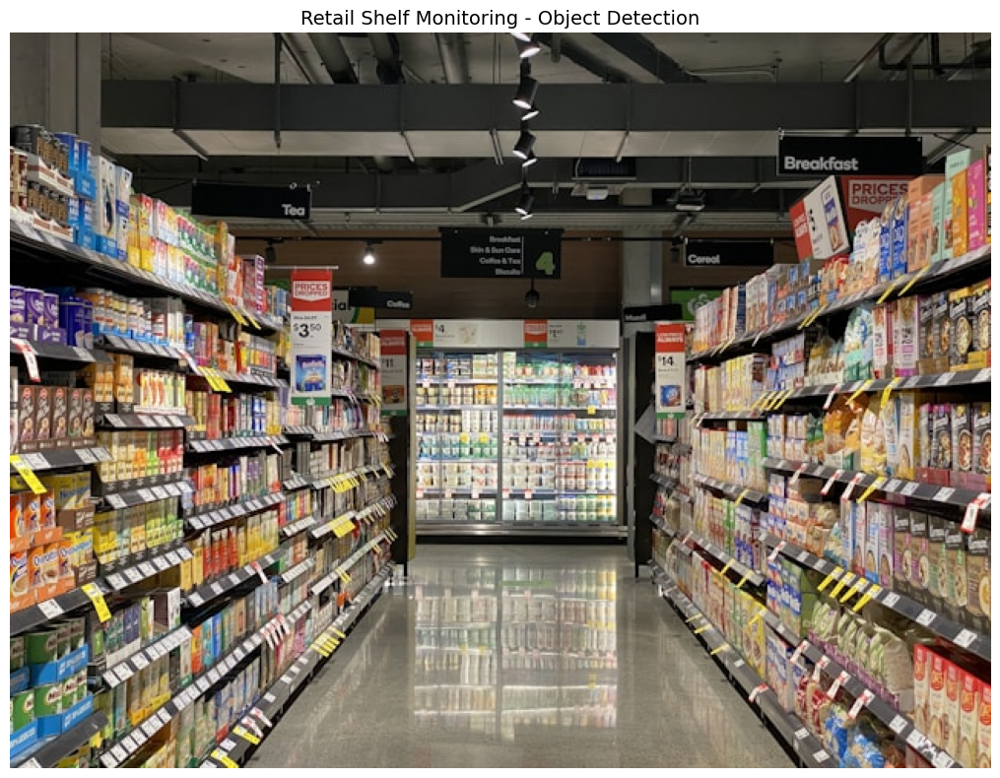


       RETAIL STORE ANALYTICS REPORT

Products on shelf: 0

Furniture items: 0
Other objects: 0

Shelf Status: NEEDS RESTOCKING
Report generated: 2026-04-17 15:14:38


In [ ]:
# Case Study 5: Retail Store Analytics with Shelf Monitoring

# Download a retail/shelf image
shelf_url = "https://images.unsplash.com/photo-1604719312566-8912e9227c6a?w=640"  # Store shelves
try:
    shelf_img = load_image_from_url(shelf_url, save_path="shelf.jpg")
except:
    shelf_img = load_image_from_url("https://ultralytics.com/images/bus.jpg", save_path="shelf.jpg")

# Run YOLOv8 detection
model_shelf = YOLO("yolov8n.pt")
results_shelf = model_shelf(shelf_img)

# Categorize detected items
product_classes = {"bottle", "cup", "wine glass", "bowl", "banana", "apple",
                    "orange", "pizza", "donut", "cake", "sandwich", "book", "vase"}
furniture_classes = {"chair", "couch", "dining table"}

product_count = 0
furniture_count = 0
other_count = 0
product_list = []

for box in results_shelf[0].boxes:
    cls_name = model_shelf.names[int(box.cls[0])]
    conf = float(box.conf[0])
    if cls_name in product_classes:
        product_count += 1
        product_list.append((cls_name, conf))
    elif cls_name in furniture_classes:
        furniture_count += 1
    else:
        other_count += 1

# Display results
annotated_shelf = results_shelf[0].plot()
plt.figure(figsize=(12, 8))
plt.imshow(cv2.cvtColor(annotated_shelf, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Retail Shelf Monitoring - Object Detection", fontsize=14)
plt.tight_layout()
plt.show()

# Generate store report
print("\n" + "="*50)
print("       RETAIL STORE ANALYTICS REPORT")
print("="*50)
print(f"\nProducts on shelf: {product_count}")
for item, conf in product_list:
    print(f"  - {item} (confidence: {conf:.2f})")
print(f"\nFurniture items: {furniture_count}")
print(f"Other objects: {other_count}")
print(f"\nShelf Status: {'WELL STOCKED' if product_count > 3 else 'NEEDS RESTOCKING'}")
print(f"Report generated: {datetime.datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")